In [2]:
import numpy as np
import torch
import matplotlib.pyplot as plt

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)

device= cpu


In [3]:
def variational_loss(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #see also: see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    #https://arxiv.org/abs/1312.6114
    vl=-0.5*torch.mean(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))
    return vl
   
def variational_loss2(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #alternative: mean squared distance from ideal mu=0 and std=1:
    vl=torch.mean(mu.pow(2)+(1-std).pow(2))
    return vl

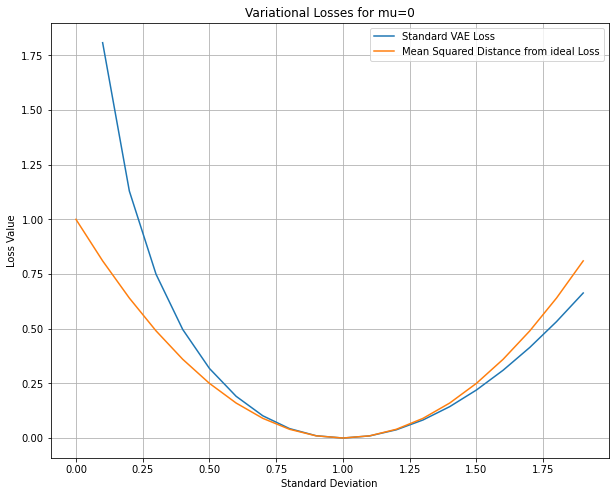

In [4]:
std=np.arange(0,20)
vloss=torch.zeros(std.shape)
vloss2=torch.zeros(std.shape)
for std_ in std:
    vloss[std_]=variational_loss(torch.tensor([0.0]),torch.tensor(0.1*std_))
    vloss2[std_]=variational_loss2(torch.tensor([0.0]),torch.tensor([0.1*std_]))

plt.figure(figsize=(10,8))
plt.plot(0.1*std,np.array(vloss))
plt.plot(0.1*std,np.array(vloss2))
plt.ylabel('Loss Value')
plt.xlabel('Standard Deviation')
plt.title('Variational Losses for mu=0')
plt.legend(('Standard VAE Loss', 'Mean Squared Distance from ideal Loss'))
plt.grid()

In [5]:
import torch
import torch.nn as nn
import torch.nn.functional as F

import numpy as np
import matplotlib.pyplot as plt
import sys
import os
import scipy.io.wavfile as wav

In [6]:
if sys.version_info[0] < 3:
    # for Python 2
    import cPickle as pickle
else:
    # for Python 3
    import pickle
   
# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("device=", device)   

device= cpu


In [7]:
def signal2pytorch(x):
    #Function to convert a signal vector x, like a mono audio signal, into a 3-d Tensor that conv1d of Pytorch expects,
    #https://pytorch.org/docs/stable/nn.html
    #Argument x: a 1-d signal as numpy array
    #input x[batch,sample]
    #output: 3-d Tensor X for conv1d input.
    #for conv1d Input: (N,Cin,Lin), Cin: numer of input channels (e.g. for stereo), Lin: length of signal, N: number of Batches (signals) 
    X = np.expand_dims(x, axis=0)  #add channels dimension (here only 1 channel)
    if len(x.shape)==1: #mono:
        X = np.expand_dims(X, axis=0)  #add batch dimension (here only 1 batch)
    X=torch.from_numpy(X)
    X=X.type(torch.Tensor)
    X=X.permute(1,0,2)  #make batch dimension first
    return X

In [8]:
class Convautoenc(nn.Module):
    def __init__(self):
        super(Convautoenc, self).__init__()
        #Analysis Filterbank with downsampling of N=8*1024, filter length of 2N, but only 32 outputs:
        #for the mean values:
        self.conv1mean=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)
        #for the standard devieation values:
        self.conv1std=nn.Conv1d(in_channels=1, out_channels=32, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True) #Padding for 'same' filters (kernel_size/2-1)

        #Synthesis filter bank:
        self.synconv1=nn.ConvTranspose1d(in_channels=32, out_channels=1, kernel_size=8*2048, stride=8*1024, padding=8*1024-1, bias=True)

    def encodermean(self, x):
        #Analysis:
        x = self.conv1mean(x)
        y = torch.tanh(x)
        return y
      
    def encoderstd(self, x):
        #Analysis:
        x = self.conv1std(x)
        y = torch.abs(torch.tanh(x))
        return y
      
    def decoder(self, y):
        #Synthesis:
        xrek= self.synconv1(y)
        return xrek
      
    def forward(self, x):
        Yencmean=model.encodermean(x)
        Yencstd=model.encoderstd(x)
        #Yvariational= torch.normal(Yencmean, Yencstd)
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        #for the randn_like see also: https://github.com/pytorch/examples/blob/master/vae/main.py
        Ypred=model.decoder(Yvariational)
        return Ypred, Yencmean, Yencstd

In [9]:
def variational_loss(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #see also: see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    #https://arxiv.org/abs/1312.6114
    vl=-0.5*torch.mean(1+ 2*torch.log(std)-mu.pow(2) -(std.pow(2)))
    return vl
   
def variational_loss2(mu, std):
    #returns the varialtional loss from arguments mean and standard deviation std
    #alternative: mean squared distance from ideal mu=0 and std=1:
    vl=torch.mean(mu.pow(2)+(1-std).pow(2))
    return vl

In [10]:
import librosa

In [11]:
#alternative: speech:
#make training set with batch of 2 speech signals:
batch=2;
#fs, x0= wav.read('./audio/test2.wav') #get size of the speech files, all need to be identical
x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        #fs, x0= wav.read('./audio/test2.wav')
        x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        #fs, x0= wav.read('./audio/test3.wav')
        x0, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    #x=x*1.0/2**15 #normalize
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) #Convert to pytorch format, batch is first dimension    
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  #MSE

c:\users\user\appdata\local\programs\python\python39\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


x.shape= (2, 264600)
X.shape= torch.Size([2, 1, 264600])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 264600)
X.shape= torch.Size([2, 1, 264600])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [12]:
Ypred, Yencmean, Yencstd = model(X)
    
#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  #the target signal with same length as model output
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_variational_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
"""
#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
#Ypred=model(X)
#Ypred=Ypred.detach()
#print("Ypred=", Ypred)
    
#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

outputlen= 262146
Input X.shape= torch.Size([2, 1, 264600])
Target Y.shape= torch.Size([2, 1, 262146])
Target Y= tensor([[[ 0.0475,  0.0463,  0.0451,  ...,  0.0069,  0.0031, -0.0009]],

        [[-0.0610, -0.0428, -0.0359,  ..., -0.0878, -0.0855, -0.0930]]])
Y.type()= torch.FloatTensor


In [13]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(2000):
        #Ypred, Yencmean, Yencstd = model(X)
        #mean values from the encoder network:
        Yencmean=model.encodermean(X)
          
        #standard deviation values from the network:
        Yencstd=model.encoderstd(X)
        #unit standard deviation:
        #Yencstd=torch.ones(Yencmean.shape)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        vl=variational_loss(Yencmean, Yencstd)
        #vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0.01*vl
        #loss= mse 
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.018706826493144035 variational loss= 2.9841063022613525
10 mse= 0.01848546229302883 variational loss= 1.714026689529419
20 mse= 0.017802322283387184 variational loss= 1.3515255451202393
30 mse= 0.016791746020317078 variational loss= 1.1704045534133911
40 mse= 0.015728071331977844 variational loss= 1.060522198677063
50 mse= 0.014600614085793495 variational loss= 0.984035849571228
60 mse= 0.013612964190542698 variational loss= 0.9249606728553772
70 mse= 0.01283511333167553 variational loss= 0.8793002367019653
80 mse= 0.012199990451335907 variational loss= 0.8399210572242737
90 mse= 0.01140859816223383 variational loss= 0.8063220381736755
100 mse= 0.010558677837252617 variational loss= 0.7770957946777344
110 mse= 0.01038836408406496 variational loss= 0.7519469261169434
120 mse= 0.009987621568143368 variational loss= 0.7291536331176758
130 mse= 0.009554442949593067 variational loss= 0.7089534401893616
140 mse= 0.009252944961190224 variational loss= 0.6929014921188354
150 mse= 0.00

1230 mse= 0.005274964962154627 variational loss= 0.5373389720916748
1240 mse= 0.005596478469669819 variational loss= 0.537147045135498
1250 mse= 0.005317241419106722 variational loss= 0.5357581377029419
1260 mse= 0.005473594181239605 variational loss= 0.5362778902053833
1270 mse= 0.005231816321611404 variational loss= 0.5365045070648193
1280 mse= 0.005295793060213327 variational loss= 0.5360110998153687
1290 mse= 0.005372010171413422 variational loss= 0.5355501770973206
1300 mse= 0.005426204297691584 variational loss= 0.5360093116760254
1310 mse= 0.005392628721892834 variational loss= 0.5376875996589661
1320 mse= 0.005330420099198818 variational loss= 0.5357754826545715
1330 mse= 0.005313212983310223 variational loss= 0.5342901349067688
1340 mse= 0.0053549897857010365 variational loss= 0.5347501635551453
1350 mse= 0.005343485623598099 variational loss= 0.5351569652557373
1360 mse= 0.005333003122359514 variational loss= 0.5341825485229492
1370 mse= 0.005326790735125542 variational loss=

MSE= 0.005299593321979046 Variational Loss: 0.522201418876648
ww= OrderedDict([('conv1mean.weight', tensor([[[-1.3523e-02, -3.1331e-03, -2.2848e-03,  ...,  4.4624e-03,
          -8.1660e-03, -8.0778e-03]],

        [[ 2.2236e-03,  1.0705e-02,  6.9600e-03,  ..., -7.3371e-05,
          -2.3966e-03,  1.6562e-03]],

        [[-1.2520e-02,  2.4940e-03, -9.9369e-03,  ...,  1.5230e-03,
           1.0444e-02, -1.1652e-03]],

        ...,

        [[-8.2871e-03, -7.3543e-04,  3.1630e-03,  ..., -6.9879e-03,
           2.5563e-03, -6.9027e-03]],

        [[-2.3891e-03, -1.9892e-03, -2.7625e-03,  ..., -9.1246e-04,
          -5.5484e-04, -4.7458e-03]],

        [[ 1.1121e-04, -2.4863e-03,  4.6052e-04,  ...,  1.0287e-02,
           1.8117e-03,  1.6598e-02]]])), ('conv1mean.bias', tensor([ 0.0089,  0.0068, -0.0119,  0.0062,  0.0018,  0.0063,  0.0065, -0.0023,
         0.0037,  0.0038, -0.0095, -0.0073,  0.0066, -0.0072,  0.0004, -0.0004,
        -0.0020, -0.0005,  0.0056,  0.0010,  0.0047, -0.0043, -

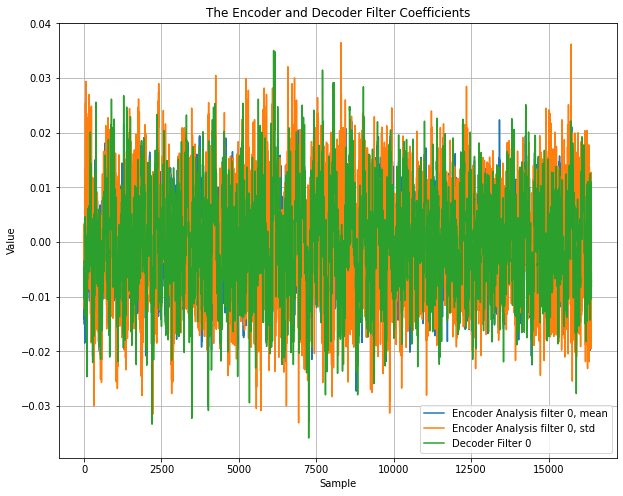

In [14]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

In [15]:
#Test on training set:
    
#predictions=model(X).cpu() # Make Predictions based on the obtained weights, on training set
#noisy case:
#predictions, Yencmean, Yencstd = model(X)
Yencmean=model.encodermean(X)
    
#no noise case
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#Add gaussian noise with unit standard deviation to encoded signal:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2

Yencstd.shape= (2, 32, 33)
predictions.shape= (2, 1, 262146)


In [16]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


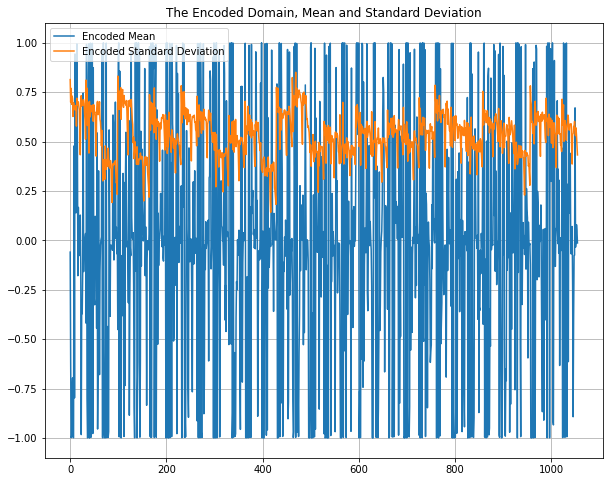

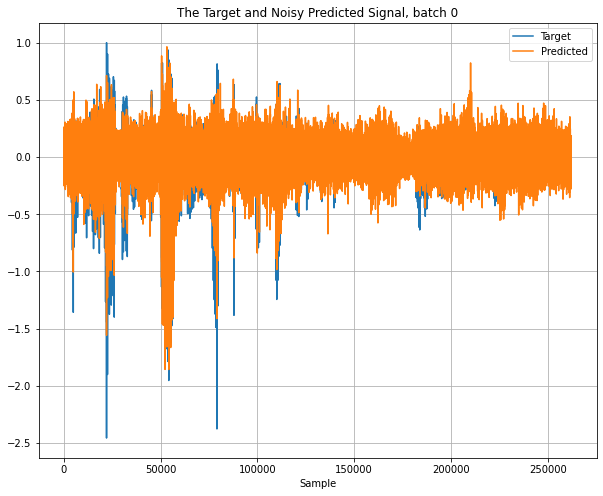

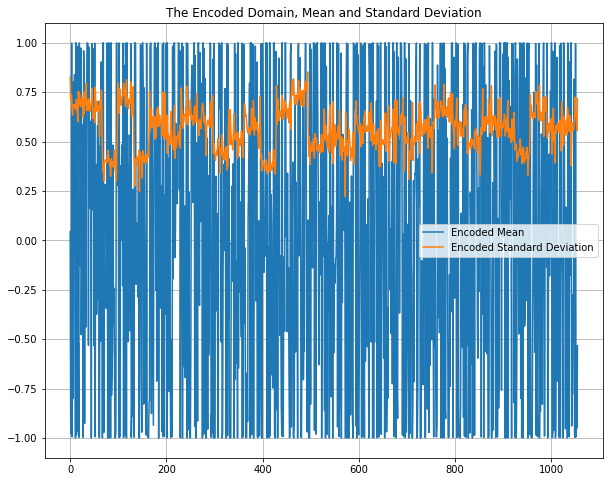

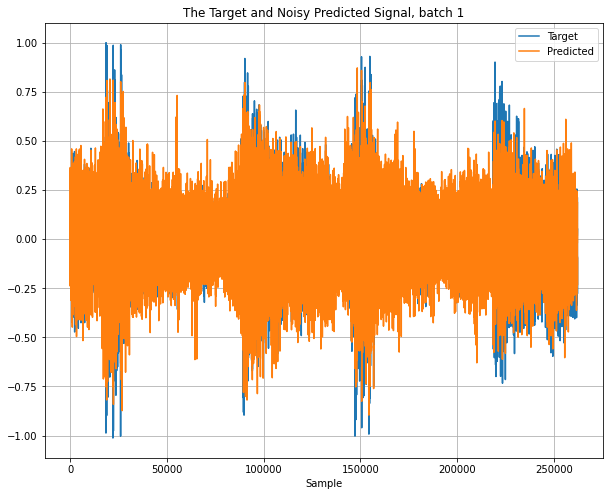

In [17]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    #print("np.reshape(Yencstd[b,:,:],(1,-1))", np.reshape(Yencstd[b,:,:],(1,-1)))
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    #No noise case:
    xrek=predclean[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

c:\users\user\appdata\local\programs\python\python39\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


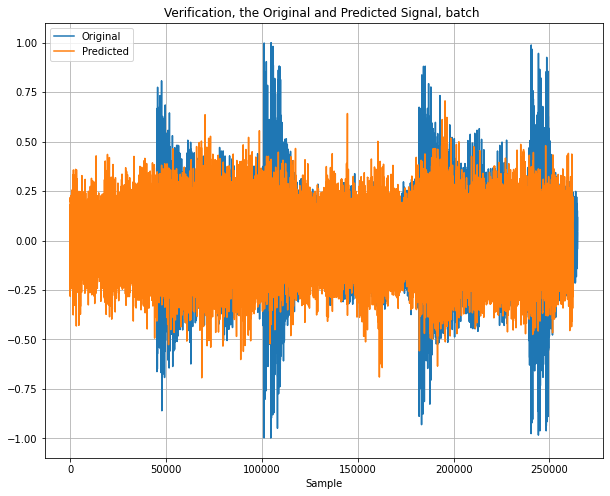

In [18]:
#Test on Verification set:
#fs, x= wav.read('test.wav')
x, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
#fs, x= wav.read('test2.wav')
#x=x*1.0/2**15 #normalize
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#No noise case:
xrek=predclean[0,0,:]  #remove unnecessary dimension for playback
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
#Add gaussian noise with unit standard deviation:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

In [19]:
#alternative: speech:
#make training set with batch of 2 speech signals:
batch=2;
#fs, x0= wav.read('./audio/test2.wav') #get size of the speech files, all need to be identical
x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        #fs, x0= wav.read('./audio/test2.wav')
        x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        #fs, x0= wav.read('./audio/test3.wav')
        x0, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    #x=x*1.0/2**15 #normalize
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) #Convert to pytorch format, batch is first dimension    
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  #MSE

c:\users\user\appdata\local\programs\python\python39\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


x.shape= (2, 264600)
X.shape= torch.Size([2, 1, 264600])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 264600)
X.shape= torch.Size([2, 1, 264600])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [20]:
Ypred, Yencmean, Yencstd = model(X)
    
#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  #the target signal with same length as model output
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_variational_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
"""
#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
#Ypred=model(X)
#Ypred=Ypred.detach()
#print("Ypred=", Ypred)
    
#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

outputlen= 262146
Input X.shape= torch.Size([2, 1, 264600])
Target Y.shape= torch.Size([2, 1, 262146])
Target Y= tensor([[[ 0.0475,  0.0463,  0.0451,  ...,  0.0069,  0.0031, -0.0009]],

        [[-0.0610, -0.0428, -0.0359,  ..., -0.0878, -0.0855, -0.0930]]])
Y.type()= torch.FloatTensor


In [21]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(2000):
        #Ypred, Yencmean, Yencstd = model(X)
        #mean values from the encoder network:
        Yencmean=model.encodermean(X)
          
        #standard deviation values from the network:
        Yencstd=model.encoderstd(X)
        #unit standard deviation:
        #Yencstd=torch.ones(Yencmean.shape)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        #vl=variational_loss(Yencmean, Yencstd)
        vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0.01*vl
        #loss= mse 
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.018744241446256638 variational loss= 0.9005889892578125
10 mse= 0.0187507513910532 variational loss= 0.5885015726089478
20 mse= 0.01868695765733719 variational loss= 0.4310506582260132
30 mse= 0.018474070355296135 variational loss= 0.3455587327480316
40 mse= 0.018237197771668434 variational loss= 0.3015890419483185
50 mse= 0.017751159146428108 variational loss= 0.2820095419883728
60 mse= 0.017118653282523155 variational loss= 0.2733607888221741
70 mse= 0.016612108796834946 variational loss= 0.2704748809337616
80 mse= 0.01638195849955082 variational loss= 0.27244606614112854
90 mse= 0.015263678506016731 variational loss= 0.2745967209339142
100 mse= 0.014951622113585472 variational loss= 0.27869006991386414
110 mse= 0.01489822007715702 variational loss= 0.28576791286468506
120 mse= 0.014560298062860966 variational loss= 0.28906485438346863
130 mse= 0.014057938009500504 variational loss= 0.29284289479255676
140 mse= 0.013656886294484138 variational loss= 0.2992215156555176
150 ms

1230 mse= 0.004451500717550516 variational loss= 0.6867722272872925
1240 mse= 0.004671114031225443 variational loss= 0.6855548024177551
1250 mse= 0.004636378958821297 variational loss= 0.686651885509491
1260 mse= 0.0048054601065814495 variational loss= 0.688194990158081
1270 mse= 0.004607188981026411 variational loss= 0.6924721598625183
1280 mse= 0.004719417076557875 variational loss= 0.6952000856399536
1290 mse= 0.004392826929688454 variational loss= 0.6930139064788818
1300 mse= 0.0043811798095703125 variational loss= 0.6911758780479431
1310 mse= 0.004563760478049517 variational loss= 0.6949039697647095
1320 mse= 0.004650887567549944 variational loss= 0.6964236497879028
1330 mse= 0.00435124384239316 variational loss= 0.6981880068778992
1340 mse= 0.004243096336722374 variational loss= 0.7005672454833984
1350 mse= 0.0047821663320064545 variational loss= 0.6974563002586365
1360 mse= 0.0045414757914841175 variational loss= 0.6960909962654114
1370 mse= 0.004469228442758322 variational loss

MSE= 0.0031988529954105616 Variational Loss: 0.9340919256210327
ww= OrderedDict([('conv1mean.weight', tensor([[[-0.0010,  0.0020, -0.0034,  ...,  0.0015,  0.0124,  0.0029]],

        [[-0.0012, -0.0016, -0.0091,  ...,  0.0084,  0.0088, -0.0032]],

        [[-0.0105, -0.0058, -0.0065,  ...,  0.0031, -0.0027, -0.0069]],

        ...,

        [[ 0.0114,  0.0081,  0.0117,  ..., -0.0055,  0.0021, -0.0077]],

        [[-0.0028,  0.0052, -0.0042,  ...,  0.0008, -0.0021,  0.0052]],

        [[ 0.0029,  0.0020, -0.0005,  ..., -0.0116,  0.0030,  0.0005]]])), ('conv1mean.bias', tensor([-4.2841e-03,  6.1904e-03, -6.8825e-04,  4.0662e-03, -3.1646e-03,
         9.1096e-04,  2.5852e-03, -1.8542e-03,  6.4969e-04, -1.7998e-04,
         3.8218e-03,  3.7574e-04,  3.5364e-04,  5.8961e-03, -3.0290e-03,
         6.7578e-04, -4.3029e-05, -8.7146e-03, -1.2177e-03,  5.0077e-03,
        -3.2970e-03, -4.2950e-03, -1.7136e-03, -5.0992e-03,  3.1441e-03,
         6.3090e-03,  3.2504e-03,  1.9725e-03, -6.1507e-03, 

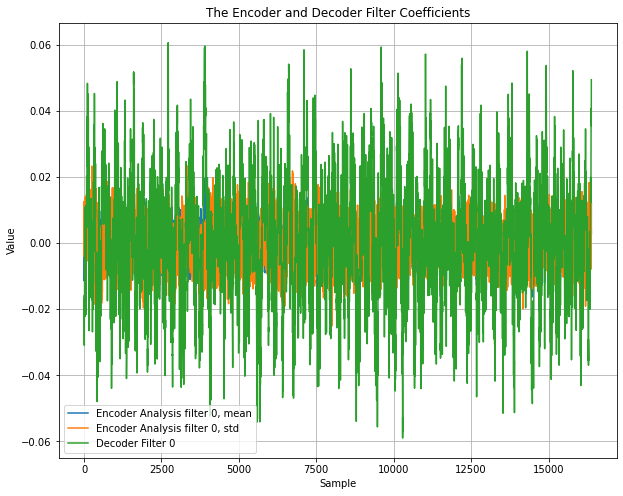

In [22]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

In [23]:
#Test on training set:
    
#predictions=model(X).cpu() # Make Predictions based on the obtained weights, on training set
#noisy case:
#predictions, Yencmean, Yencstd = model(X)
Yencmean=model.encodermean(X)
    
#no noise case
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#Add gaussian noise with unit standard deviation to encoded signal:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2

Yencstd.shape= (2, 32, 33)
predictions.shape= (2, 1, 262146)


In [24]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


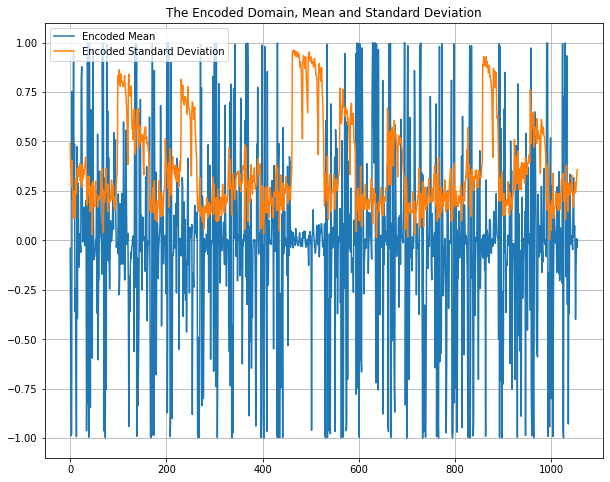

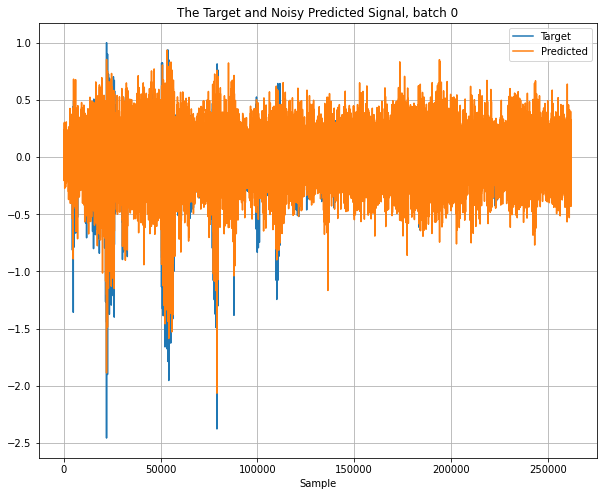

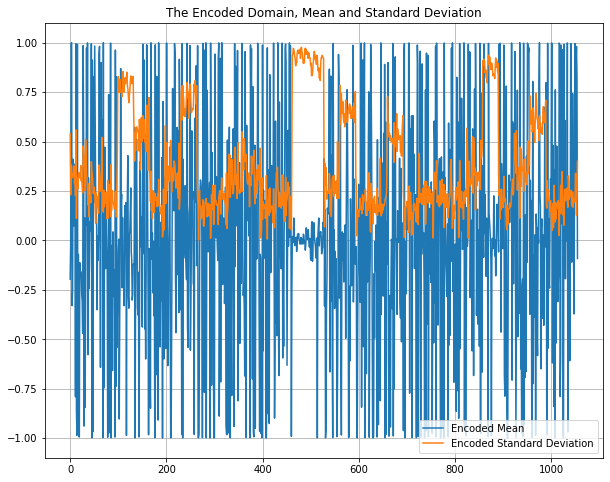

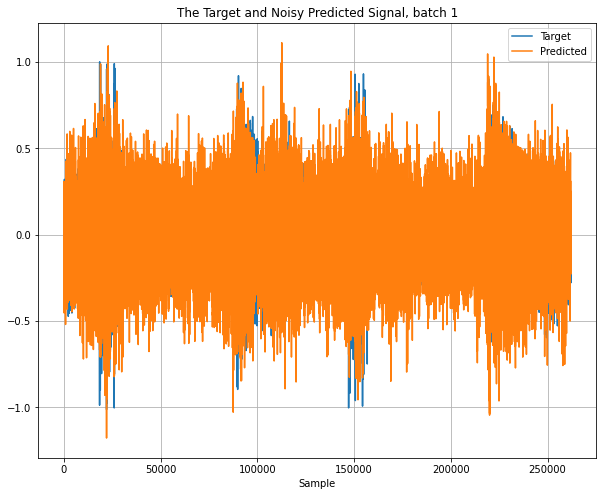

In [25]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    #print("np.reshape(Yencstd[b,:,:],(1,-1))", np.reshape(Yencstd[b,:,:],(1,-1)))
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    #No noise case:
    xrek=predclean[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


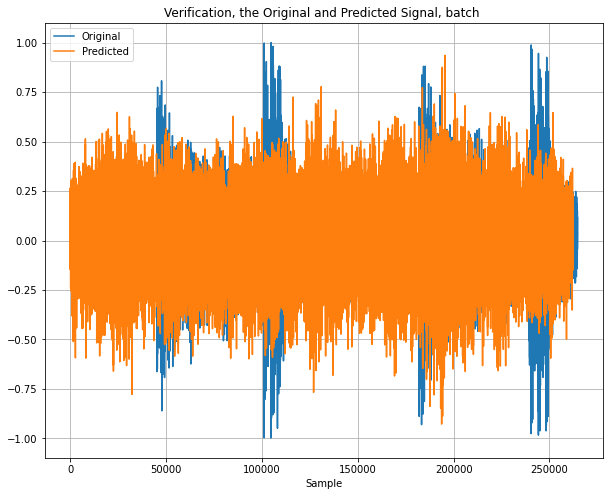

In [27]:
#Test on Verification set:
#fs, x= wav.read('test.wav')
x, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
#fs, x= wav.read('test2.wav')
#x=x*1.0/2**15 #normalize
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#No noise case:
xrek=predclean[0,0,:]  #remove unnecessary dimension for playback
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
#Add gaussian noise with unit standard deviation:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))

In [28]:
#alternative: speech:
#make training set with batch of 2 speech signals:
batch=2;
#fs, x0= wav.read('./audio/test2.wav') #get size of the speech files, all need to be identical
x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
xlen=max(x0.shape)
x=np.zeros((batch,xlen))
for b in range(batch):
    if b==0: 
        #fs, x0= wav.read('./audio/test2.wav')
        x0, fs = librosa.load("./Iron Maiden - The Number Of The Beast.mp3", mono=True, sr=None, duration=6, offset=13)
    if b==1:
        #fs, x0= wav.read('./audio/test3.wav')
        x0, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=8)
    x0= x0/max(x0)
    x[b,:]=x0
    #x=x*1.0/2**15 #normalize
    print("x.shape=", x.shape)
    X=signal2pytorch(x).to(device) #Convert to pytorch format, batch is first dimension    
    print("X.shape=", X.shape)
    print("Generate Model:")
    model = Convautoenc().to(device)
    print('Total number of parameters: %i' % (sum(p.numel() for p in model.parameters() if p.requires_grad)))
    print("Def. loss function:")
    loss_fn = nn.MSELoss()  #MSE

c:\users\user\appdata\local\programs\python\python39\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


x.shape= (2, 264600)
X.shape= torch.Size([2, 1, 264600])
Generate Model:
Total number of parameters: 1572929
Def. loss function:
x.shape= (2, 264600)
X.shape= torch.Size([2, 1, 264600])
Generate Model:
Total number of parameters: 1572929
Def. loss function:


In [29]:
Ypred, Yencmean, Yencstd = model(X)
    
#Ypred=Ypred.detach()
outputlen=len(Ypred[0,0,:]) #length of the signal at the output of the network.
print("outputlen=", outputlen)
    
Y=X[:,:,:outputlen]  #the target signal with same length as model output
    
print("Input X.shape=", X.shape )
print("Target Y.shape=", Y.shape)
print("Target Y=", Y)
#print("max(max(Y))=", max(max(max(Y))))
#print("min(min(Y))=", min(min(min(Y))))
print("Y.type()=", Y.type())
        
learning_rate = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)#, betas=(0.9, 0.999))
"""
try:
    checkpoint = torch.load("audio_variational_autoenc.torch",map_location='cpu')
    model.load_state_dict(checkpoint['model_state_dict'])
    #optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
    optimizer.load_state_dict(checkpoint['optimizer_state_dict'])
except IOError:
    print("fresh start")
"""
#optimrandomdir_pytorch.optimizer(model, loss_fn, X, Ypred, iterations=300, startingscale=1.0, endscale=0.0)
#Ypred=model(X)
#Ypred=Ypred.detach()
#print("Ypred=", Ypred)
    
#randdir=True # True for optimization of random direction, False for pytorch optimization
randdir=False

outputlen= 262146
Input X.shape= torch.Size([2, 1, 264600])
Target Y.shape= torch.Size([2, 1, 262146])
Target Y= tensor([[[ 0.0475,  0.0463,  0.0451,  ...,  0.0069,  0.0031, -0.0009]],

        [[-0.0610, -0.0428, -0.0359,  ..., -0.0878, -0.0855, -0.0930]]])
Y.type()= torch.FloatTensor


In [30]:
if randdir==True:
    #optimization of weights using method of random directions:
    optimrandomdir_pytorch.optimizer(model, loss_fn, X, Y, iterations=100000, startingscale=0.25, endscale=0.0)
    #--End optimization of random directions------------------------
else:
    for epoch in range(2000):
        #Ypred, Yencmean, Yencstd = model(X)
        #mean values from the encoder network:
        Yencmean=model.encodermean(X)
          
        #standard deviation values from the network:
        #Yencstd=model.encoderstd(X)
        #unit standard deviation:
        Yencstd=torch.ones(Yencmean.shape)
          
        Yvariational= Yencmean + Yencstd*torch.randn_like(Yencstd)
        Ypred=model.decoder(Yvariational)
          
        mse=loss_fn(Ypred, Y)
        #vl=variational_loss(Yencmean, Yencstd)
        vl=variational_loss2(Yencmean, Yencstd)
        loss= mse + 0*vl
        #loss= mse 
        if epoch%10==0:
             print(epoch, "mse=", mse.item(), "variational loss=", vl.item())
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
    #"""
    torch.save({#'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict()}, "audio_variational_autoenc.torch")
    #"""
    

0 mse= 0.020024960860610008 variational loss= 0.005795441567897797
10 mse= 0.019842607900500298 variational loss= 0.01667037606239319
20 mse= 0.019548695534467697 variational loss= 0.045513566583395004
30 mse= 0.019143983721733093 variational loss= 0.09841952472925186
40 mse= 0.018366282805800438 variational loss= 0.16126930713653564
50 mse= 0.017535820603370667 variational loss= 0.22483721375465393
60 mse= 0.0166532713919878 variational loss= 0.283492773771286
70 mse= 0.015963397920131683 variational loss= 0.3350902497768402
80 mse= 0.015238494612276554 variational loss= 0.37961721420288086
90 mse= 0.014668007381260395 variational loss= 0.41616663336753845
100 mse= 0.014184032566845417 variational loss= 0.4475290775299072
110 mse= 0.013545515947043896 variational loss= 0.47430363297462463
120 mse= 0.013260598294436932 variational loss= 0.4961273968219757
130 mse= 0.012962867505848408 variational loss= 0.5149679183959961
140 mse= 0.012261049821972847 variational loss= 0.532793521881103

1230 mse= 0.009975055232644081 variational loss= 0.8294038772583008
1240 mse= 0.009313484653830528 variational loss= 0.8297104239463806
1250 mse= 0.009561486542224884 variational loss= 0.8305822610855103
1260 mse= 0.00989545602351427 variational loss= 0.8316287398338318
1270 mse= 0.009814247488975525 variational loss= 0.8319056034088135
1280 mse= 0.008951784111559391 variational loss= 0.8320037722587585
1290 mse= 0.010207215324044228 variational loss= 0.8323049545288086
1300 mse= 0.009096483699977398 variational loss= 0.8323030471801758
1310 mse= 0.010175785981118679 variational loss= 0.8329974412918091
1320 mse= 0.00947534665465355 variational loss= 0.8338547348976135
1330 mse= 0.009698408655822277 variational loss= 0.8340908885002136
1340 mse= 0.009211811237037182 variational loss= 0.8340867757797241
1350 mse= 0.00992849562317133 variational loss= 0.8342570066452026
1360 mse= 0.009740209206938744 variational loss= 0.8342381119728088
1370 mse= 0.009681056253612041 variational loss= 0.

MSE= 0.009663417935371399 Variational Loss: 0.42625316977500916
ww= OrderedDict([('conv1mean.weight', tensor([[[-0.0112, -0.0208, -0.0275,  ..., -0.0013, -0.0050,  0.0046]],

        [[-0.0099, -0.0222, -0.0222,  ..., -0.0029,  0.0085,  0.0068]],

        [[-0.0199, -0.0117, -0.0160,  ...,  0.0042, -0.0101, -0.0117]],

        ...,

        [[ 0.0027, -0.0069,  0.0007,  ...,  0.0157, -0.0016, -0.0004]],

        [[ 0.0123,  0.0054,  0.0095,  ..., -0.0116,  0.0025, -0.0062]],

        [[-0.0218, -0.0257, -0.0216,  ...,  0.0003, -0.0119, -0.0110]]])), ('conv1mean.bias', tensor([ 0.0055,  0.0103,  0.0092, -0.0069, -0.0171,  0.0100,  0.0178, -0.0035,
         0.0034, -0.0157, -0.0328,  0.0099,  0.0147, -0.0095,  0.0021, -0.0034,
        -0.0069,  0.0050, -0.0083,  0.0069, -0.0114,  0.0163,  0.0103, -0.0066,
         0.0062, -0.0173, -0.0137,  0.0078,  0.0039, -0.0214, -0.0083, -0.0134])), ('conv1std.weight', tensor([[[-0.0010, -0.0040, -0.0029,  ...,  0.0001, -0.0036,  0.0054]],

        [

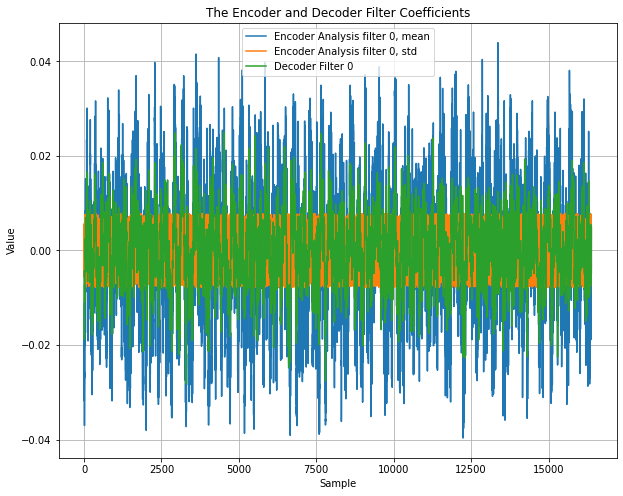

In [31]:
print("MSE=", loss_fn(Ypred, Y).item(), "Variational Loss:", variational_loss(Yencmean, Yencstd).item())
ww = model.state_dict()   #read obtained weights
print("ww=", ww)
#Plot obtained weights:
plt.figure(figsize=(10,8))
plt.plot(np.transpose(np.array(ww['conv1mean.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['conv1std.weight'][0:1,0,:])))
plt.plot(np.transpose(np.array(ww['synconv1.weight'][0:1,0,:])))
plt.legend(('Encoder Analysis filter 0, mean','Encoder Analysis filter 0, std', 'Decoder Filter 0'))
plt.xlabel('Sample')
plt.ylabel('Value')
plt.title('The Encoder and Decoder Filter Coefficients')
plt.grid()

In [32]:
#Test on training set:
    
#predictions=model(X).cpu() # Make Predictions based on the obtained weights, on training set
#noisy case:
#predictions, Yencmean, Yencstd = model(X)
Yencmean=model.encodermean(X)
    
#no noise case
predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#Add gaussian noise with unit standard deviation to encoded signal:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions=model.decoder(Yvariational)
    
predictions=predictions.detach()
predictions=np.array(predictions)
Yencmean=np.array(Yencmean.detach())
Yencstd=np.array(Yencstd.detach())
print("Yencstd.shape=",Yencstd.shape)
    
Y=np.array(Y) #target
#print("Y=",Y)
print("predictions.shape=", predictions.shape)
#convert to numpy:
#https://discuss.pytorch.org/t/how-to-transform-variable-into-numpy/104/2

Yencstd.shape= (2, 32, 33)
predictions.shape= (2, 1, 262146)


In [33]:
import IPython.display as ipd

"The training set output for clean encoded signal for batch0"


"The training set output for noisy encoded signal for batch0"


"The training set output for clean encoded signal for batch1"


"The training set output for noisy encoded signal for batch1"


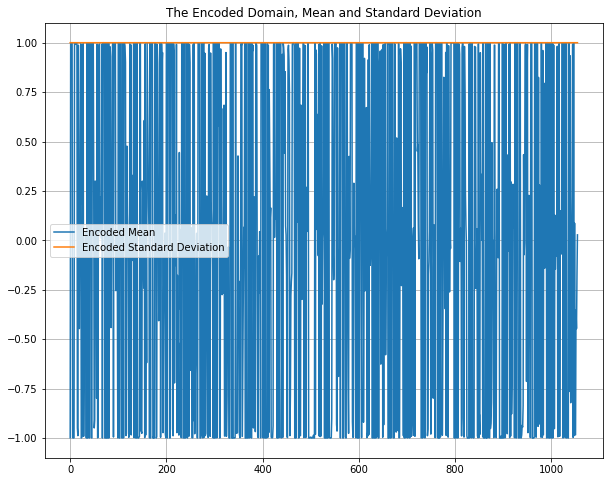

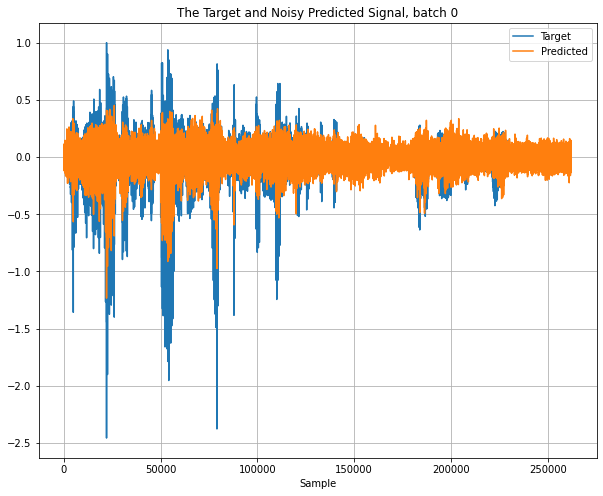

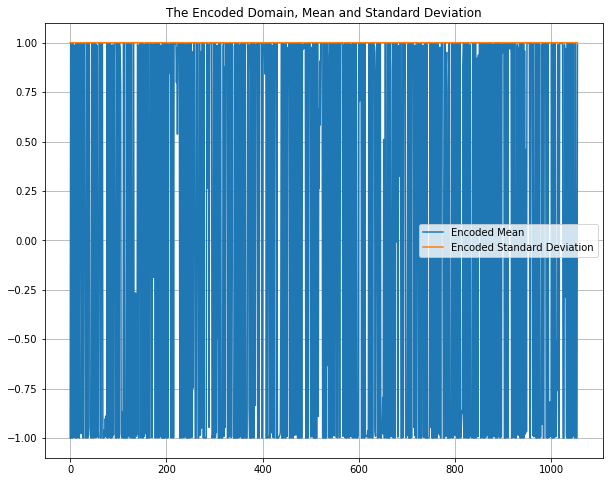

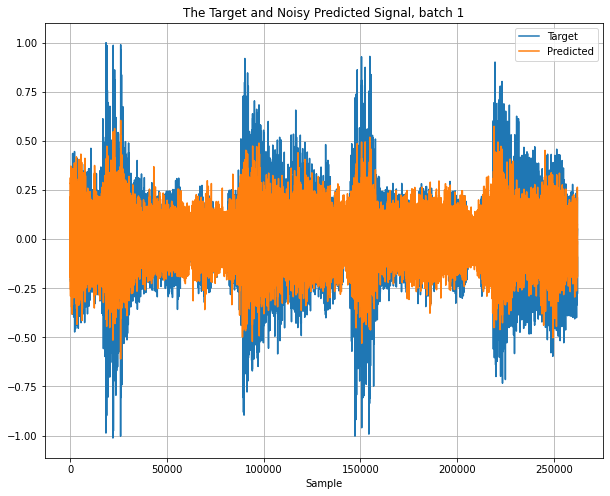

In [34]:
#Plot target signal and output of autoencoder:

for b in range(batch):
    #print("np.reshape(Yencstd[b,:,:],(1,-1))", np.reshape(Yencstd[b,:,:],(1,-1)))
    plt.figure(figsize=(10,8))
    plt.plot(np.reshape(Yencmean[b,:,:],(1,-1))[0,:])
    plt.plot(np.reshape(Yencstd[b,:,:],(1,-1))[0,:])
    plt.legend(('Encoded Mean', 'Encoded Standard Deviation'))
    plt.title('The Encoded Domain, Mean and Standard Deviation')
    plt.grid()
    plt.figure(figsize=(10,8))
    plt.plot(np.array(Y[b,0,:]))
    plt.plot(predictions[b,0,:])
    plt.legend(('Target','Predicted'))
    plt.title('The Target and Noisy Predicted Signal, batch '+str(b))
    plt.xlabel('Sample')
    plt.grid()

    #No noise case:
    xrek=predclean[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for clean encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))
      
    xrek=predictions[b,0,:]  #remove unnecessary dimension for playback
    xrek=np.clip(xrek, -1.0,1.0)
    wav.write('testrekvae'+str(b)+'.wav', fs, np.int16(2**15*xrek))
    print('"The training set output for noisy encoded signal for batch'+str(b)+'"')
    display(ipd.Audio(2**15*xrek,rate=fs))

c:\users\user\appdata\local\programs\python\python39\lib\site-packages\librosa\core\audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


The verification set input to the variational autoencoder


The verification set output for clean encoded signal


The verification set output for noisy encoded signal


Only noise as encoded signal
The decoded signal


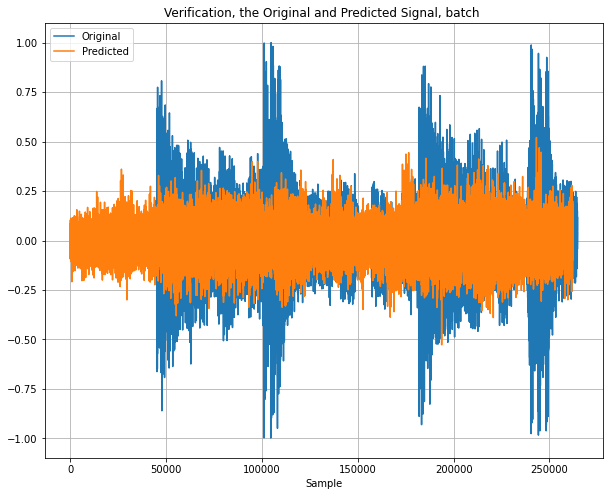

In [35]:
#Test on Verification set:
#fs, x= wav.read('test.wav')
x, fs = librosa.load("./Iron Maiden - Aces High.mp3", mono=True, sr=None, duration=6, offset=0)
#fs, x= wav.read('test2.wav')
#x=x*1.0/2**15 #normalize
x=x/max(x)
    
print("The verification set input to the variational autoencoder")
display(ipd.Audio(2**14*x,rate=fs))
X=signal2pytorch(x).to(device)
Yencmean=model.encodermean(X)

predclean=model.decoder(Yencmean)
predclean=predclean.detach() #no noise case
predclean=np.array(predclean)
    
#No noise case:
xrek=predclean[0,0,:]  #remove unnecessary dimension for playback
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testvervaeclean'+str(b)+'.wav', fs, np.int16(2**15*xrek))
print("The verification set output for clean encoded signal")
display(ipd.Audio(2**15*xrek, rate=fs))
    
#Add gaussian noise with unit standard deviation:
Yvariational= Yencmean + torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
b=0
plt.figure(figsize=(10,8))
plt.plot(np.array(X[b,0,:]))
plt.plot(predictions[b,0,:])
plt.legend(('Original','Predicted'))
plt.title('Verification, the Original and Predicted Signal, batch ')
plt.xlabel('Sample')
plt.grid()
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('testver.wav', fs, np.int16(2**15*xrek))
print("The verification set output for noisy encoded signal")
display(ipd.Audio('testver.wav', rate=fs))
print("Only noise as encoded signal")

Yvariational=  torch.randn_like(Yencmean)
predictions= model.decoder(Yvariational) # Make Predictions based on the obtained weights, on verification set
predictions=predictions.detach()
predictions=np.array(predictions)
xrek=predictions[:,0,:]
xrek=np.transpose(xrek)
xrek=np.clip(xrek, -1.0,1.0)
wav.write('noisevarout.wav', fs, np.int16(2**15*xrek))
print("The decoded signal")
display(ipd.Audio('noisevarout.wav', rate=fs))